## Third Model [lightgbm]

In [ ]:
print("Unique labels in y:", np.unique(y_train, return_counts=True))

Unique labels in y: (array([0, 1]), array([227452, 227452]))


In [ ]:
lightgbm = lgb.LGBMClassifier(
    boosting_type='gbdt',
    n_estimators=500,             # You can also increase this if convergence is slow
    max_depth=50,
    num_leaves=381,
    learning_rate=0.01,
    feature_fraction=0.899,
    bagging_fraction=0.899,
    reg_alpha=0.01,
    reg_lambda=0.8,
    device='gpu',
    gpu_platform_id=0,
    gpu_device_id=0,
    random_state=42
)


In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV


#### Feature Selection

The feature selection technique used in the paper "An Optimized LightGBM Model for Fraud Detection" by K. Huang is Recursive Feature Elimination with Cross-Validation (RFECV). Specifically:

In [ ]:
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
selector = RFECV(estimator=lightgbm, step=1, cv=cv, scoring='roc_auc', verbose=1)
selector.fit(X_resampled, y_resampled)

In [ ]:
print(f"Optimal number of features: {selector.n_features_}")
selected_features = selector.support_
print(f"Selected features indices: {selected_features}")

Optimal number of features: 29
Selected features indices: [ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True False  True  True  True
  True  True  True  True  True  True]


In [ ]:
X_test.columns

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount'],
      dtype='object')

In [ ]:
X_test_selected_features=['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V21',
       'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount']

In [ ]:
# X_train_selected = X_train.loc[:, selected_features]
# X_test_selected = X_test.loc[:, selected_features]

In [ ]:
X_train_selected = X_train [X_test_selected_features]
X_test_selected = X_test [X_test_selected_features]

Fit Model

In [ ]:
lightgbm.fit(X_train_selected, y_train)

[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899
[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899
[LightGBM] [Info] Number of positive: 227452, number of negative: 227452
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 7395
[LightGBM] [Info] Number of data points in the train set: 454904, number of used features: 29
[LightGBM] [Info] Using requested OpenCL platform 0 device 0
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 3050 Laptop GPU, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have be

LGBMClassifier(bagging_fraction=0.899, device='gpu', feature_fraction=0.899,
               gpu_device_id=0, gpu_platform_id=0, learning_rate=0.01,
               max_depth=50, n_estimators=500, num_leaves=381, random_state=42,
               reg_alpha=0.01, reg_lambda=0.8)

### evaluation

[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899
[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899
Accuracy: 0.9996306913106942
Precision: 0.9992970246568602
Recall: 0.9999648277438756
F1 Score: 0.9996308146689639
ROC AUC: 0.9999699039782098

Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     56863
           1       1.00      1.00      1.00     56863

    accuracy                           1.00    113726
   macro avg       1.00      1.00      1.00    113726
weighted avg       1.00      1.00      1.00    113726



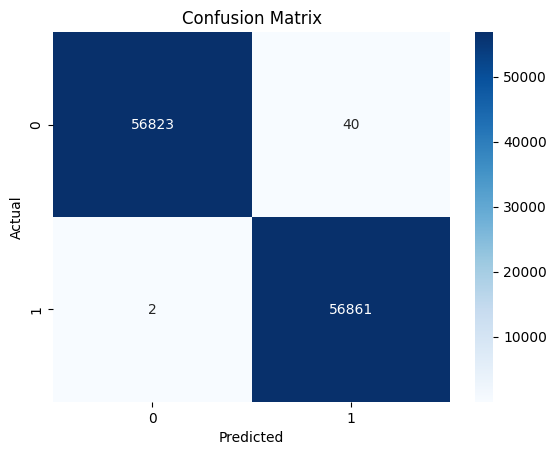

In [ ]:
y_pred = lightgbm.predict(X_test_selected)
y_proba = lightgbm.predict_proba(X_test_selected)[:, 1]  # for ROC AUC (binary classification)

# Basic scores
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))
print("ROC AUC:", roc_auc_score(y_test, y_proba))

# Classification report
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

### Explaination

#### lofo

[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899
[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899
[LightGBM] [Info] Number of positive: 45490, number of negative: 45490
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 7395
[LightGBM] [Info] Number of data points in the train set: 90980, number of used features: 29
[LightGBM] [Info] Using requested OpenCL platform 0 device 0
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 3050 Laptop GPU, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been 

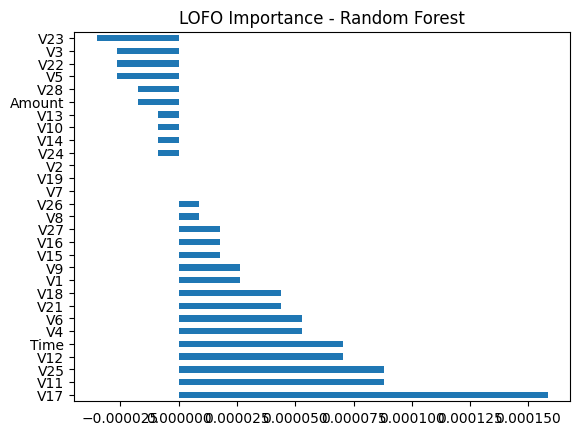

In [ ]:
baseline = cross_val_score(lightgbm, X_test_selected, y_test, cv=5).mean()

lofo_scores = {}
for col in X_test_selected.columns:
    X_lofo = X_test_selected.drop(columns=[col])
    score = cross_val_score(lightgbm, X_lofo, y_test, cv=5).mean()
    lofo_scores[col] = baseline - score

lofo_df = pd.Series(lofo_scores).sort_values(ascending=False)
lofo_df.plot(kind='barh')
plt.title("LOFO Importance - Random Forest")
plt.show()

#### Shap

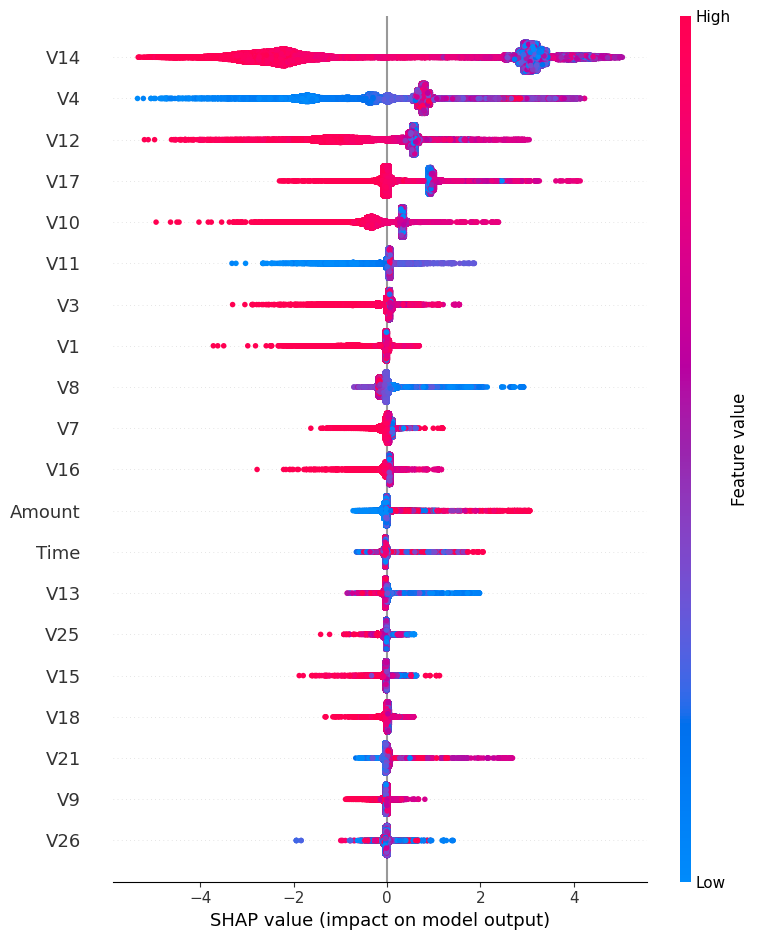

In [ ]:
explainer = shap.Explainer(lightgbm)
shap_values = explainer(X_test_selected)
shap.summary_plot(shap_values, X_test_selected)

#### Lime

In [ ]:
explainer = LimeTabularExplainer(
    training_data=np.array(X_train_selected),
    feature_names=X_train_selected.columns,
    class_names=[0, 1],  # Adjust based on your task
    mode='classification'
)

In [ ]:
# Explain one prediction
i = 0
exp = explainer.explain_instance(X_test_selected.iloc[i].values, lightgbm.predict_proba, num_features=10)

[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


In [ ]:
with open('lime_explanation_lightgbm.html', 'w') as f:
    f.write(exp.as_html())

#### ALE

In [ ]:
# For logits (raw scores)
logit_fun_lgbm = lambda x: lightgbm.predict(x, raw_score=True)

# For probabilities
proba_fun_lgbm = lightgbm.predict_proba  # returns array of shape (n_samples, n_classes)


In [ ]:
logit_ale = ALE(logit_fun_lgbm, feature_names=X_test_selected_features, target_names=[0,1])
proba_ale = ALE(proba_fun_lgbm, feature_names=X_test_selected_features, target_names=[0,1])


In [ ]:
# Choose one or more features to explain
explanation_logit = logit_ale.explain(X_test_selected.to_numpy())
explanation_proba = proba_ale.explain(X_test_selected.to_numpy())


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899


array([[<Axes: xlabel='Time', ylabel='ALE'>,
        <Axes: xlabel='V1', ylabel='ALE'>,
        <Axes: xlabel='V2', ylabel='ALE'>,
        <Axes: xlabel='V3', ylabel='ALE'>,
        <Axes: xlabel='V4', ylabel='ALE'>,
        <Axes: xlabel='V5', ylabel='ALE'>,
        <Axes: xlabel='V6', ylabel='ALE'>,
        <Axes: xlabel='V7', ylabel='ALE'>,
        <Axes: xlabel='V8', ylabel='ALE'>,
        <Axes: xlabel='V9', ylabel='ALE'>],
       [<Axes: xlabel='V10', ylabel='ALE'>,
        <Axes: xlabel='V11', ylabel='ALE'>,
        <Axes: xlabel='V12', ylabel='ALE'>,
        <Axes: xlabel='V13', ylabel='ALE'>,
        <Axes: xlabel='V14', ylabel='ALE'>,
        <Axes: xlabel='V15', ylabel='ALE'>,
        <Axes: xlabel='V16', ylabel='ALE'>,
        <Axes: xlabel='V17', ylabel='ALE'>,
        <Axes: xlabel='V18', ylabel='ALE'>,
        <Axes: xlabel='V19', ylabel='ALE'>],
       [<Axes: xlabel='V21', ylabel='ALE'>,
        <Axes: xlabel='V22', ylabel='ALE'>,
        <Axes: xlabel='V23', ylabel='A

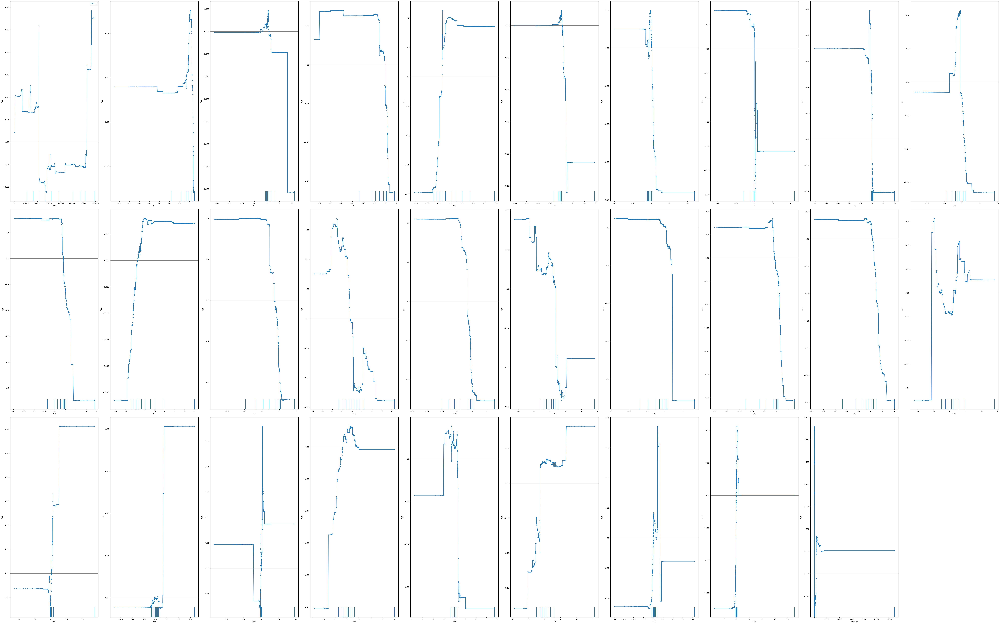

In [ ]:
plot_ale(explanation_logit,  targets=[0], n_cols=10, fig_kw={'figwidth': 80, 'figheight': 50}, sharey=None)

array([[<Axes: xlabel='Time', ylabel='ALE'>,
        <Axes: xlabel='V1', ylabel='ALE'>,
        <Axes: xlabel='V2', ylabel='ALE'>,
        <Axes: xlabel='V3', ylabel='ALE'>,
        <Axes: xlabel='V4', ylabel='ALE'>,
        <Axes: xlabel='V5', ylabel='ALE'>,
        <Axes: xlabel='V6', ylabel='ALE'>,
        <Axes: xlabel='V7', ylabel='ALE'>,
        <Axes: xlabel='V8', ylabel='ALE'>,
        <Axes: xlabel='V9', ylabel='ALE'>],
       [<Axes: xlabel='V10', ylabel='ALE'>,
        <Axes: xlabel='V11', ylabel='ALE'>,
        <Axes: xlabel='V12', ylabel='ALE'>,
        <Axes: xlabel='V13', ylabel='ALE'>,
        <Axes: xlabel='V14', ylabel='ALE'>,
        <Axes: xlabel='V15', ylabel='ALE'>,
        <Axes: xlabel='V16', ylabel='ALE'>,
        <Axes: xlabel='V17', ylabel='ALE'>,
        <Axes: xlabel='V18', ylabel='ALE'>,
        <Axes: xlabel='V19', ylabel='ALE'>],
       [<Axes: xlabel='V21', ylabel='ALE'>,
        <Axes: xlabel='V22', ylabel='ALE'>,
        <Axes: xlabel='V23', ylabel='A

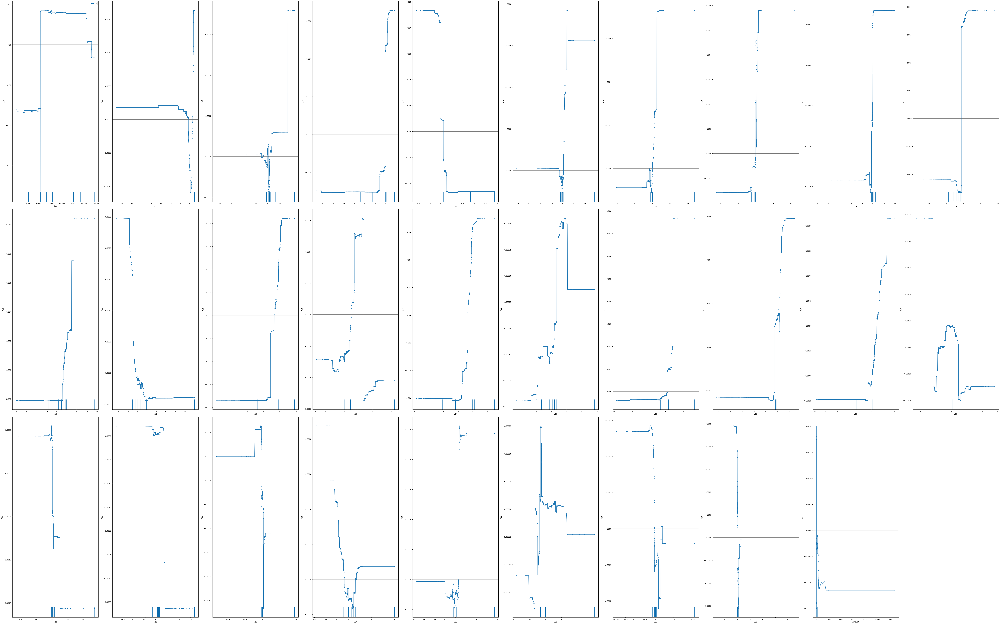

In [ ]:
plot_ale(explanation_proba,  targets=[0], n_cols=10, fig_kw={'figwidth': 80, 'figheight': 50}, sharey=None)


#### ICE

In [ ]:
len(X_test_selected.columns)

29

[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899
[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899
[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899
[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899
[Lig

/home/bouda/miniforge3/lib/python3.12/site-packages/sklearn/inspection/_plot/partial_dependence.py:1293: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  _, ax = plt.subplots()


[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899
[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899
[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899
[LightGBM] [Warning] feature_fraction is set=0.899, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.899
[LightGBM] [Warning] bagging_fraction is set=0.899, subsample=1.0 will be ignored. Current value: bagging_fraction=0.899
[Lig

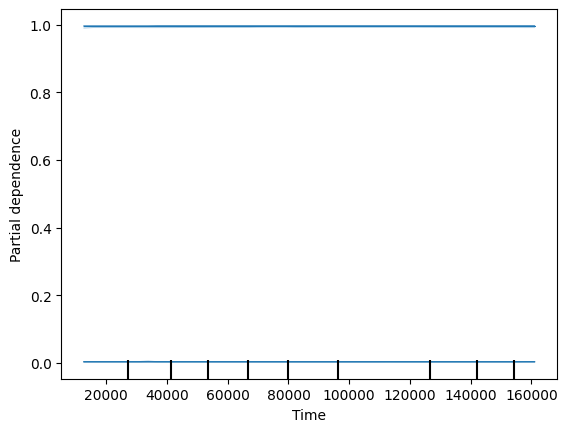

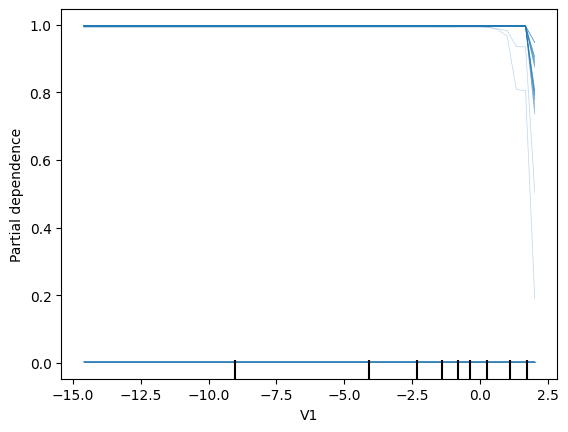

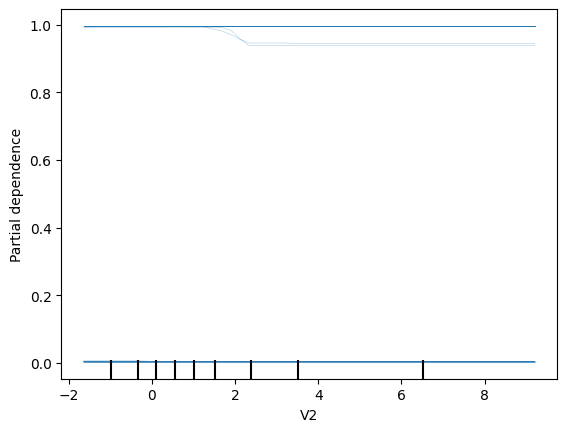

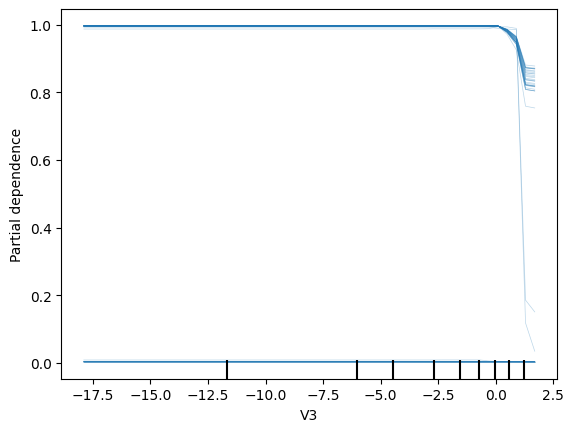

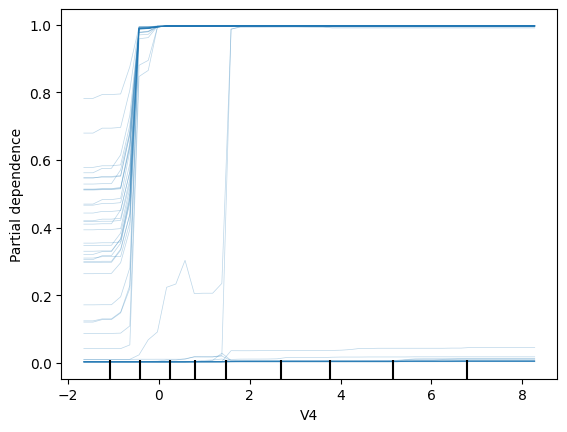

...

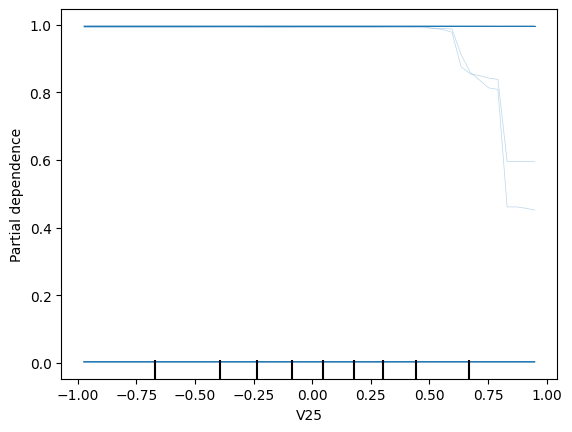

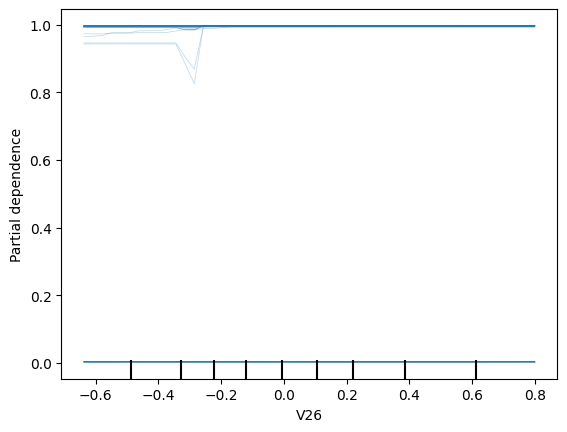

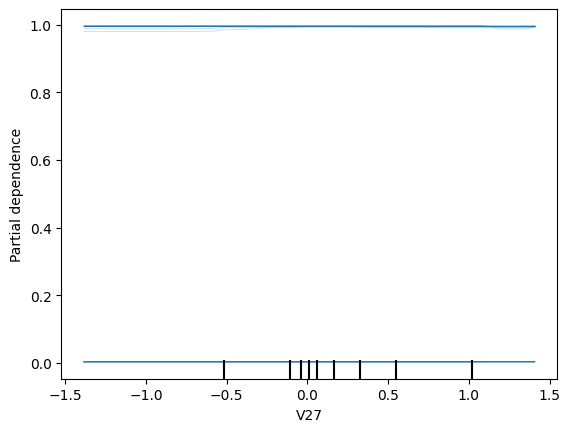

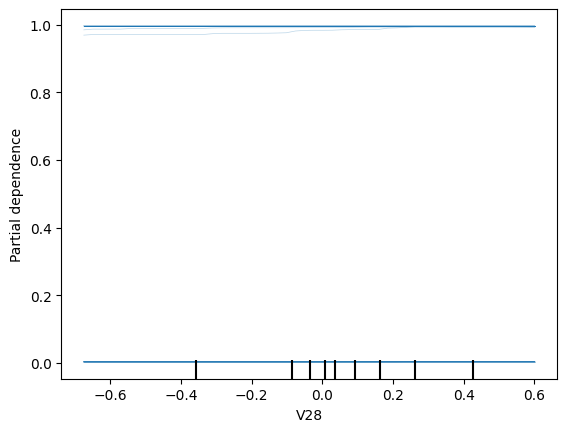

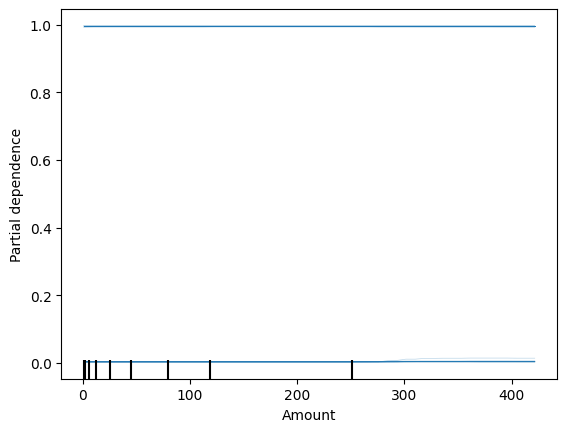

In [ ]:
for i in range (len(X_test_selected.columns)):
    PartialDependenceDisplay.from_estimator(
        estimator=lightgbm,
        X=X_test_selected,
        features=[i],
        kind = "individual",
        grid_resolution=50,
        subsample=50,
        random_state=42
    )